<div style="text-align: center;"> 
    <h1> <font color=darkblue> Machine Learning Prediction model</font></h1>
</div>

## Table of Contents

- **1. About Project**
- **2. Load and Explore the Dataset**
   - a) Import required libraries
   - b) Read The DataSet
   - c) Check the shape and basic information of the dataset.
   - d) Function for displaying information of two dataset side by side
   - e) The number of unique rows in each attribute
   - f) The Unique value names of each attribute in both Dataset
   - g) Statistical analysis of numerical and categorical attribute in data

- **3. Data Preprocessing**
   - a) Checking Null value
   - b) Checking duplicated value
   - c) Encode the categorical columns
   - d) Scalling Numerical Columns
   - e) Removing prefixex from Section column
   - f) Replacing Whitespace in Column Named to Underscore
- **4. Feature Engineering**
   - a)  Handling Multicollinearity
   - b) Importance of feature through feature selection
- **5. Exploratory Data Analysis**
   - **a) Uni variate Data Analysis**
       - Skewness in features
       - Box Plot to see the variance the numerical features
   - **b) Bi variate Data Analysis**
       - Features distrubution In All Categories
       - Check the distribution of the target variable (i.e. 'exam score')
       - Correlation heatmap
   - **c) Multi variate Data Analysis**
       - PairPlot of Numerical features
       - pairplot of all features
- **6. Model Selection**
   - a) Checking what model will fit the target Regression or classification
   - b) Model Trainer
   - c) plot Comparison of Model Performance: Mean Squared Error and R-squared
   - d) Hyperparameter Tuning 
   - e) Re-checking model performance after hypertunning
   - f) Cross Validation
- **7. Final Model Building and Predicting Exam score**
   - Building final model on test data
   - Printing Submission.csv 
- **8. Error Analysis**

## <font color=Blue>Used High Schools Students Performance data</font>

### Objective:
1. The participant's task is to use the train.csv dataset and predict the exam
score in the test.csv file.
2. participants are asked to submit using the submission.csv template.

### Dataset Information:
### <span style="color: green;">Description:</span>

This dataset contains information on the performance of high school
students in examination, including their grades and demographic information. The
data was collected from three high schools in the United States.

### <span style="color: green;">Attribute Information:</span> 

- **Roll no** : The student's roll no
- **Gender**: The gender of the student (male/female)
- **Section** : The student's class section
- **Parental level of education**: The highest level of education attained by the
student's parent(s) or guardian(s)
- **Lunch**: Whether the student receives free or reduced-price lunch (yes/no)
- **Test preparation course**: Whether the student completed a test preparation course
(yes/no)
- **Practicals score**: The student's score on a standardized practicals test
- **Viva score**: The student's score on a standardized viva-voce test
- **Exam score**: The student's score on a standardized exam test

<div style="text-align: center;">
    <h2><span style="color: red;">Load and Explore the Dataset:</span></h2>
</div>

### 1. Import required libraries

In [1]:
## importing libraries 
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

from sklearn.metrics import accuracy_score, r2_score
from sklearn.ensemble import RandomForestRegressor


import lightgbm as lgb

### 2. Read The DataSet

In [2]:
# reading the Train dataset

try:
    train = pd.read_csv('Data/train.csv', index_col=0)
    test = pd.read_csv('Data/test.csv', index_col=0)
except FileNotFoundError: # if file path is invalid of the file does not exist
    print("File not found.")
except pd.errors.EmptyDataError: # if the file is empty or has no data
    print("No data")
except pd.errors.ParserError: # if the file has malformed or invalid data that cannot be parsed.
    print("Parse error")
except UnicodeDecodeError: # if the file has a different encoding than the default or specified one.
    print("Encoding error")
except Exception: # handling other exceptions
    print("Error encountered! Please review your code")

In [3]:
##Fetching first few rows to verify the dataset has loaded
train.head()

,test preparation,gender,parental level of education,lunch,Section,practical score,viva score,exam score
Roll no,,,,,,,,
EXA000001,none,male,some college,standard,Section A,70,73,70
EXA000002,none,male,master's degree,free/reduced,Section C,55,54,52
EXA000003,none,male,master's degree,free/reduced,Section E,56,46,43
EXA000004,none,female,some college,free/reduced,Section C,35,47,41
EXA000005,none,female,high school,standard,Section C,87,92,81


In [4]:
# ##Fetching first few rows to verify the dataset has loaded
test.head()

,test preparation,gender,parental level of education,lunch,Section,practical score,viva score
Roll no,,,,,,,
EXA32000,none,male,associate's degree,standard,Section C,74,89
EXA32001,completed,male,some high school,standard,Section E,66,75
EXA32002,none,male,some high school,standard,Section C,52,55
EXA32003,completed,male,some high school,standard,Section D,69,85
EXA32004,none,female,bachelor's degree,standard,Section E,46,62


### 3. Check the shape and basic information of the dataset.

In [5]:
## Checking the shape of dataset
print("Train: ", train.shape)
print('Number of rows: ', train.shape[0])
print('Number of Columns: ', train.shape[1])
print()
print("Test:", test.shape)
print('Number of rows: ', test.shape[0])
print('Number of Columns: ', test.shape[1])

Train:  (31999, 8)
Number of rows:  31999
Number of Columns:  8

Test: (100, 7)
Number of rows:  100
Number of Columns:  7


In [6]:
## Information of train dataset
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31999 entries, EXA000001 to EXA031999
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   test preparation             31999 non-null  object
 1   gender                       31999 non-null  object
 2   parental level of education  31999 non-null  object
 3   lunch                        31999 non-null  object
 4   Section                      31999 non-null  object
 5   practical score              31999 non-null  int64 
 6   viva score                   31999 non-null  int64 
 7   exam score                   31999 non-null  int64 
dtypes: int64(3), object(5)
memory usage: 2.2+ MB


**Observations:**

   - There are 31999 rows and 8 columns in train dataset
   - The columns include data types such as integer and object.
   - There is no missing data.
   - The DataFrame contains information related students performance, including attributes like test preparation, gender, parental level of education, lunch, Section, and various attributes.
   - Some columns like 'test preparation', 'gender','parental level of educationSeller_Type','lunch', 'Section' is in string format and required conversion to numeric column for analysis.

In [7]:
# Print information for test dataset
print("\nTest Dataset Info:")
test.info()


Test Dataset Info:
<class 'pandas.core.frame.DataFrame'>
Index: 100 entries, EXA32000 to EXA32099
Data columns (total 7 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   test preparation             100 non-null    object
 1   gender                       100 non-null    object
 2   parental level of education  100 non-null    object
 3   lunch                        100 non-null    object
 4   Section                      100 non-null    object
 5   practical score              100 non-null    int64 
 6   viva score                   100 non-null    int64 
dtypes: int64(2), object(5)
memory usage: 6.2+ KB


**Observations:**

   - There are 100 rows and 7 columns in test dataset
   - The columns include data types such as  2 integer and 5 object.
   - There is no missing data.
   - The DataFrame contains information related students performance, including attributes like test preparation, gender, parental level of education, lunch, Section, and various attributes.
   - Some columns like 'test preparation', 'gender','parental level of educationSeller_Type','lunch', 'Section' is in string format and required conversion to numeric column for analysis.

### 4.) Function for displaying  information of two dataset side by side

In [8]:
from IPython.display import HTML, display

def side_by_side(*dfs, titles):
    html = '<div style="display:flex">'
    for df, title in zip(dfs, titles):
        html += '<div style="margin-right: 4em">'
        html += f'<h3>{title}</h3>'  # Add title as heading
        html += df.to_html()
        html += '</div>'
    html += '</div>'
    display(HTML(html))

### 5.) The number of unique rows in each attribute

In [9]:
# Total Unique value in each row with column name
a = train.nunique().to_frame('No. of Unique')
b = test.nunique().to_frame('No. of Unique')

# Display side by side with titles
side_by_side(a, b, titles=['Train Data Description', 'Test Data Description'])

,No. of Unique
test preparation,2
gender,2
parental level of education,6
lunch,2
Section,5
practical score,79
viva score,71
exam score,74
,No. of Unique
test preparation,2


### 6.) The Unique value names of each attribute in both Dataset

In [10]:
## Printing the unique value counts of each records of train dataset
print("# Unique value Names of Train Dataset in each columns")
print()
try:
    print("test preparation: ", train['test preparation '].unique())
    print("gender: ",train['gender'].unique())
    print("parental level of education: ",train['parental level of education'].unique())
    print("lunch: ",train['lunch'].unique())
    print("Section: ",train['Section'].unique())
    print()
    print("# Unique value Names of Train Dataset in each columns")
    print()
    print("test preparation: ", test['test preparation '].unique())
    print("gender: ",test['gender'].unique())
    print("parental level of education: ",test['parental level of education'].unique())
    print("lunch: ",test['lunch'].unique())
    print("Section: ",test['Section'].unique())
except KeyError as e:
    print(f"Column not found: {e}")

# Unique value Names of Train Dataset in each columns

test preparation:  ['none' 'completed']
gender:  ['male' 'female']
parental level of education:  ['some college' "master's degree" 'high school' "associate's degree"
 'some high school' "bachelor's degree"]
lunch:  ['standard' 'free/reduced']
Section:  ['Section A' 'Section C' 'Section E' 'Section D' 'Section B']

# Unique value Names of Train Dataset in each columns

test preparation:  ['none' 'completed']
gender:  ['male' 'female']
parental level of education:  ["associate's degree" 'some high school' "bachelor's degree"
 "master's degree" 'some college' 'high school']
lunch:  ['standard' 'free/reduced']
Section:  ['Section C' 'Section E' 'Section D' 'Section A' 'Section B']


### 7.) List of Numerical Attributes in the Dataset

In [11]:
# np.number includes all numerical types(integer, float etc)
print("Train: ", train.select_dtypes(include=np.number).columns) 
print("Test: ",test.select_dtypes(include=np.number).columns)

Train:  Index(['practical score', 'viva score', 'exam score'], dtype='object')
Test:  Index(['practical score', 'viva score'], dtype='object')


### 8.) statistical analysis of numerical attributes - count, mean, standard deviation etc

In [12]:
# Compute descriptive statistics of numerical attributes in both data
a = train.select_dtypes(include=np.number).describe()
b = test.select_dtypes(include=np.number).describe()

# Display side by side with titles
side_by_side(a, b, titles=['Train Data Description', 'Test Data Description'])

### Inferences from Train Data Description:

- **Central Tendency:**
  - The mean scores for practical (67.84), viva (70.38), and exam (69.14) are relatively high, suggesting that on average, students perform well in all three assessments.
- **Spread of Scores:**
  - The standard deviations for practical (15.23), viva (14.09), and exam (15.01) scores indicate a moderate spread around the mean, showing some variability in students' performances.
- **Symmetry and Skewness:**
  - The close proximity of the median to the mean for practical (68 vs 67.84), viva (70 vs 70.38), and exam (70 vs 69.14) scores suggests that the distributions are relatively symmetric and likely not significantly skewed.
- **Score Range:**
  - All three assessments have a wide range of scores (15 to 100), indicating a diverse level of proficiency among students.
- **Interquartile Range (IQR):**
  - The IQR for practical (22), viva (19), and exam (21) scores shows that the middle 50% of the students have scores within these ranges:
     - Practical: 58 to 80
     - Viva: 61 to 80
     - Exam: 59 to 80
     
### Inferences from Test Data Description:

- **Central Tendency:**
  - The mean scores for practical (65.19) and viva (68.95) are slightly lower compared to the training data, but still relatively high.
- **Spread of Scores:**
  - The standard deviations for practical (15.53) and viva (14.64) scores indicate a similar variability to the training data.
- **Symmetry and Skewness:**
  - The median is close to the mean for both practical (65.5 vs 65.19) and viva (68 vs 68.95) scores, suggesting relatively symmetric distributions.
- **Score Range:**
  - The practical scores range from 20 to 100, while viva scores range from 38 to 100, indicating slightly higher minimum scores compared to the training data.
- **Interquartile Range (IQR):**
  - The IQR for practical (21.5) and viva (18) scores shows that the middle 50% of the students have scores within these ranges:
     - Practical: 54.75 to 76.25
     - Viva: 59 to 77

### 9.) List of Categorical Attributes in the Dataset

In [13]:
print(train.select_dtypes(include='object').columns)
print(test.select_dtypes(include='object').columns)

Index(['test preparation ', 'gender', 'parental level of education', 'lunch',
       'Section'],
      dtype='object')
Index(['test preparation ', 'gender', 'parental level of education', 'lunch',
       'Section'],
      dtype='object')


### 10) Statistical Analysis of Categorcial Attributes

In [14]:
# Compute descriptive statistics
a = train.select_dtypes(include='object').describe().T
b = test.select_dtypes(include='object').describe().T

# Display side by side with titles
side_by_side(a, b, titles=['Train Data Description', 'Test Data Description'])

,count,unique,top,freq
test preparation,31999,2,none,21031
gender,31999,2,female,16031
parental level of education,31999,6,some college,7083
lunch,31999,2,standard,21296
Section,31999,5,Section C,10323
,count,unique,top,freq
test preparation,100,2,none,66
gender,100,2,male,56
parental level of education,100,6,associate's degree,27
lunch,100,2,standard,71


### Inferences from Train Data Description:

- **Test Preparation:** Majority did not take test preparation (66%).
- **Gender:** Slightly more females (50.1%).
- **Parental Education:** Most parents have some college education (22.1%).
- **Lunch:** Most students have standard lunch (66.6%).
- **Section:** Largest group in Section C (32.3%).

### Inferences from Test Data Description:

- **Test Preparation:** Majority did not take test preparation (66%).
- **Gender:** Slightly more males (56%).
- **Parental Education:** Most parents have an associate's degree (27%).
- **Lunch:** Most students have standard lunch (71%).
- **Section:** Largest group in Section D (30%).

<div style="text-align: center;">
<h2><span style="color: red;">Data Preprocessing:</span></h2>
</div>

### 11) Checking If Null values available in the dataset

In [15]:
## Checking Null values in the coloumn
print("Null value in Train Data:", train.isnull().sum().sum())
print("Null value in Test Data:", test.isnull().sum().sum())

Null value in Train Data: 0
Null value in Test Data: 0


### Inference:

- No null values founded. So no missing values imputation is required.

### 12) Check for the presence of the duplicate records in the dataset? If present drop them

In [16]:
## the number of duplicated records in the dataset
print("Duplicated records in Train:", train.duplicated().sum())
print("Duplicated records in Test:", test.duplicated().sum())

Duplicated records in Train: 1414
Duplicated records in Test: 0


- 1414 duplicated Records found in Train data, we need to drop the duplicates there is no use of this

In [17]:
# Identifying duplicated records
duplicate_records = train[train.duplicated()]

# Checking if there are any duplicate records
if not duplicate_records.empty:
    # If duplicates are found, inform the user and proceed to drop them
    print("Duplicate records found. Dropping duplicates...")
    
    # Dropping duplicate records
    train_df = train.drop_duplicates(keep='first')
    
    # Informing the user that duplicates have been dropped and providing the updated shape of the data
    print("Duplicates dropped. Updated shape of the data:", train_df.shape)
else:
    # If no duplicate records are found, inform the user
    print("No duplicate records found.")

Duplicate records found. Dropping duplicates...
Duplicates dropped. Updated shape of the data: (30585, 8)


### 13). Encode the categorical columns

- We encode categorical variables to make them compatible with machine learning algorithms that require numerical input, improving model performance and accuracy.

In [18]:
## Checking categorical column in dataframe Train
cat_columns_train = train_df.select_dtypes('O')
a = cat_columns_train.head(3).T

## Checking categorical column in dataframe Test
cat_columns_test = test.select_dtypes('O')
b = cat_columns_test.head(3).T

# Display side by side with titles
side_by_side(a, b, titles=[' Categorical col in Train Data', 'Categorical col in Test Data'])

Roll no,EXA000001,EXA000002,EXA000003
test preparation,none,none,none
gender,male,male,male
parental level of education,some college,master's degree,master's degree
lunch,standard,free/reduced,free/reduced
Section,Section A,Section C,Section E
Roll no,EXA32000,EXA32001,EXA32002
test preparation,none,completed,none
gender,male,male,male
parental level of education,associate's degree,some high school,some high school
lunch,standard,standard,standard


### <font color=DarkPink>Performing Label Encoder to Encode Categorical Data<font>
    
- **Label Encoding** converts categorical variables into numerical values by assigning a unique integer to each category, making it suitable for ordinal data but potentially introducing ordinal relationships to nominal data.

In [19]:
## Copy data 
train_df2 =  train_df.copy()
test_df = test.copy()

In [20]:
# Manual encoding for categorical columns
encoding_maps = {
    'test preparation ': {'none': 0, 'completed': 1},
    'gender': {'male': 0, 'female': 1},
    'lunch': {'standard': 0, 'free/reduced': 1}
}

# Apply manual encoding to the specified columns in train_df2
for col, mapping in encoding_maps.items():
    train_df2[col] = train_df2[col].map(mapping)

# Apply manual encoding to the specified columns in test_df
for col, mapping in encoding_maps.items():
    test_df[col] = test_df[col].map(mapping)
    

In [21]:
# # Watching Train and test data after label encoding
a = train_df2.head(3).T
b = test_df.head(3).T

# Display side by side with titles
side_by_side(a, b, titles=['Train Data After Encoding Cat col', 'Test Data After Encoding Cat col'])

Roll no,EXA000001,EXA000002,EXA000003
test preparation,0,0,0
gender,0,0,0
parental level of education,some college,master's degree,master's degree
lunch,0,1,1
Section,Section A,Section C,Section E
practical score,70,55,56
viva score,73,54,46
exam score,70,52,43
Roll no,EXA32000,EXA32001,EXA32002
test preparation,0,1,0


### Dummy Encoding Categorical Columns

In [22]:
# get dummies for all features but remove the first one(avoid multicollinearity) also called Dummy Variable Trap

## Dummy encdoing on categorical data
# train_df2_encoded = pd.get_dummies(train_df2, columns=['test preparation ','gender','parental level of education', 'lunch', 'Section'],drop_first= True)
# test_df_encoded = pd.get_dummies(test_df, columns=['test preparation ','gender','parental level of education', 'lunch', 'Section'],drop_first= True)

train_df2_encoded = pd.get_dummies(train_df2, columns=['parental level of education', 'Section'],drop_first= True)
test_df_encoded = pd.get_dummies(test_df, columns=['parental level of education', 'Section'],drop_first= True)

In [23]:
train_df3 = train_df2_encoded.copy()
test_df3 = test_df_encoded.copy()

### 14) Scalling Numerical Columns

In [24]:
scaler = StandardScaler()
train_df2_encoded[['practical score', 'viva score', 'exam score']] = scaler.fit_transform(train_df2_encoded[['practical score', 'viva score', 'exam score']]) 
                                        
test_df_encoded[['practical score', 'viva score']] = scaler.fit_transform(test_df_encoded[['practical score', 'viva score']]) 

In [25]:
## Visulaizing data after scalling 
a = train_df2_encoded.head(3).T
b = test_df_encoded.head(3).T

# Display side by side with titles
side_by_side(a, b, titles=[' Encoded and Scaled Train Data', 'Encoded and Scaled Test Data'])

Roll no,EXA000001,EXA000002,EXA000003
test preparation,0,0,0
gender,0,0,0
lunch,0,1,1
practical score,0.140875,-0.843765,-0.778122
viva score,0.182236,-1.165656,-1.73319
exam score,0.054883,-1.145063,-1.745037
parental level of education_bachelor's degree,False,False,False
parental level of education_high school,False,False,False
parental level of education_master's degree,False,True,True
parental level of education_some college,True,False,False


### 15) Removing Prefixes of Section Columns

In [26]:
# Function to rename columns by removing the prefix
def rename_columns(df, prefix):
    df.columns = [col.replace(prefix, '') for col in df.columns]
    return df

# Remove the prefix 'Section_' from column names
prefix_to_remove = 'Section_'
train_df2_encoded = rename_columns(train_df2_encoded, prefix_to_remove)
test_df_encoded = rename_columns(test_df_encoded, prefix_to_remove)
train_df3 = rename_columns(train_df3, prefix_to_remove)
test_df3 = rename_columns(test_df3, prefix_to_remove)

a = train_df2_encoded.head(3).T
b = test_df_encoded.head(3).T

# Display side by side with titles
side_by_side(a, b, titles=[' Updated Train Data', 'Updated Test Data'])

Roll no,EXA000001,EXA000002,EXA000003
test preparation,0,0,0
gender,0,0,0
lunch,0,1,1
practical score,0.140875,-0.843765,-0.778122
viva score,0.182236,-1.165656,-1.73319
exam score,0.054883,-1.145063,-1.745037
parental level of education_bachelor's degree,False,False,False
parental level of education_high school,False,False,False
parental level of education_master's degree,False,True,True
parental level of education_some college,True,False,False


- Now Section_Section B named as Section B

### 16) Replacing Whitespace in Column Named to Underscore

In [27]:
# Replace whitespaces in column names with underscores
train_df2_encoded.columns = [col.replace(' ', '_') for col in train_df2_encoded.columns]
test_df_encoded.columns = [col.replace(' ', '_') for col in test_df_encoded.columns]
train_df3.columns = [col.replace(' ', '_') for col in train_df3.columns]
test_df3.columns = [col.replace(' ', '_') for col in test_df3.columns]
print(train_df2_encoded.columns)
print(test_df_encoded.columns)

Index(['test_preparation_', 'gender', 'lunch', 'practical_score', 'viva_score',
       'exam_score', 'parental_level_of_education_bachelor's_degree',
       'parental_level_of_education_high_school',
       'parental_level_of_education_master's_degree',
       'parental_level_of_education_some_college',
       'parental_level_of_education_some_high_school', 'Section_B',
       'Section_C', 'Section_D', 'Section_E'],
      dtype='object')
Index(['test_preparation_', 'gender', 'lunch', 'practical_score', 'viva_score',
       'parental_level_of_education_bachelor's_degree',
       'parental_level_of_education_high_school',
       'parental_level_of_education_master's_degree',
       'parental_level_of_education_some_college',
       'parental_level_of_education_some_high_school', 'Section_B',
       'Section_C', 'Section_D', 'Section_E'],
      dtype='object')


<div style="text-align: center;">
    <h2><span style="color: red;">Feature Engineering:</span></h2>
</div>

### 17) Handling Multicollinearity:

- Check for multicollinearity among features, especially with the dummy encoded variables, and remove highly correlated features:

- **Use VIF (Variance Inflation Factor) to detect multicollinearity**

###  Detection of multicollinearity in original features.

In [28]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Function to calculate VIF
def calculate_vif(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    df_numeric = df[numeric_columns]
    
    # Calculate VIF for each feature
    vif_data = pd.DataFrame()
    vif_data["feature"] = df_numeric.columns
    vif_data["VIF"] = [variance_inflation_factor(df_numeric.values, i) for i in range(len(df_numeric.columns))]
    
    return vif_data

# Calculate VIF for training data
vif_train = calculate_vif(train_df)
a = vif_train.head(3)

# Calculate VIF for test data
vif_test = calculate_vif(test)
b = vif_test.head(3)


# Display side by side with titles
side_by_side(a, b, titles=[' VIF for Training Data:', 'VIF for Test Data:'])


,feature,VIF
0,practical score,15.035776
1,viva score,16.818134
2,exam score,15.515423
,feature,VIF
0,practical score,11.20237
1,viva score,11.20237


### Inference: 

- The Variance Inflation Factor (VIF) is a measure used to detect multicollinearity in regression models. High VIF values indicate that a feature is highly collinear with other features, which can cause issues in model interpretation and stability. Typically, a VIF value above 10 suggests high multicollinearity.

- **Inference from VIF Results**

- High Multicollinearity:
    - **Training Data:** The features practical_score, viva_score, and exam_score all have VIF values well above 10, indicating high multicollinearity among these features. This suggests that these features are highly correlated with each other, which can affect the stability and interpretability of the model.
    
    - **Test Data:** The VIF for practical_score is also high, though lower than in the training data. This might indicate that the test data has less severe multicollinearity compared to the training data or that there are fewer correlated features in the test set.
    
- **Feature Implications:**

- High VIF values in the training data suggest that you might want to consider techniques to address multicollinearity, such as removing one or more of the highly correlated features, combining features, or using dimensionality reduction techniques like Principal Component Analysis (PCA).

- **VIF Consistency:**

- The discrepancy between VIF values in training and test data could be due to differences in feature distributions or correlations in the two datasets. 

### 18) Feature Selection:

- Select the most relevant features using techniques like recursive feature elimination, LASSO, or feature importance from tree-based models:
- **Using a RandomForest to get feature importance:**

In [29]:
## Split Data into Features and Target
A = train_df3.drop(columns=[ 'exam_score'])
b = train_df3['exam_score']

## Split Data into Training and Testing Sets
A_train, A_test, b_train, b_test = train_test_split(A, b, test_size=0.2, random_state=42)

# Initialize and fit scaler on training data
scaler = StandardScaler()
A_train_scaled = scaler.fit_transform(A_train)
# Transform test data using the same scaler
A_test_scaled = scaler.transform(A_test)

## Feature Selection using Random Forest
## Identify the most important features.
model = RandomForestRegressor()
model.fit(A_train_scaled, b_train)
importances = model.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': A.columns, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
feature_importance_df

,Feature,Importance
4,viva_score,0.295292
3,practical_score,0.285883
1,gender,0.051958
0,test_preparation_,0.051033
11,Section_C,0.037612
6,parental_level_of_education_high_school,0.035560
2,lunch,0.035162
12,Section_D,0.034613
8,parental_level_of_education_some_college,0.033967
9,parental_level_of_education_some_high_school,0.032921


### Inference: 

- **Top Features:**
   - Viva Score and Practical Score: Also highly important.
   
- **Least Important Features:**
   - Gender, Test Preparation, Lunch, Sections, and Parental Education: Minimal impact on exam score.


<div style="text-align: center;">
    <h2><span style="color: red;">Exploratory Data Analysis:</span></h2>
</div>

<div style="text-align: center;">
<h3>Uni-Varient Data Analysis</h3>
</div>

In [30]:
train_df3.skew()

test_preparation_                                0.660517
gender                                           0.003466
lunch                                            0.696400
practical_score                                 -0.285235
viva_score                                      -0.176733
exam_score                                      -0.206227
parental_level_of_education_bachelor's_degree    2.588805
parental_level_of_education_high_school          1.397413
parental_level_of_education_master's_degree      3.015842
parental_level_of_education_some_college         1.336979
parental_level_of_education_some_high_school     1.742228
Section_B                                        1.500840
Section_C                                        0.761212
Section_D                                        1.112303
Section_E                                        2.041832
dtype: float64

### Observation: 

- Parental Education: Higher levels of parental education have the strongest positive impact on the target variable.
- Sections: Being in certain sections (B, C, D, E) also positively impacts the target variable.
- Lunch Type: Having a standard lunch has a notable negative impact.
- Test Preparation: Not doing any test preparation has a significant negative impact.
- Practical and Viva Scores: These have a moderate negative impact.

### 19) Features distrubution In All Categories

- In this segment, we'll explore the distribution of categorical features. Are the categories within each feature fairly balanced?

In [31]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

features = [
    'test preparation ', 'gender', 'parental level of education',
    'lunch', 'Section'
]

color_palette = ['#F7DC6F', '#1F77B4', '#FF7F0E', '#2CA02C', '#D62728']

# Create a subplot for multiple donut charts
fig = make_subplots(rows=3, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}],
                                           [{'type':'domain'}, {'type':'domain'}],
                                           [{'type':'domain'}, {'type':'domain'}]],
                   subplot_titles=[f'Distribution of {feature}' for feature in features])

for i, feature in enumerate(features):
    row = i // 2 + 1
    col = i % 2 + 1
    data = train[feature].value_counts()
    
    fig.add_trace(go.Pie(labels=data.index, values=data.values, hole=0.4, 
                         marker=dict(colors=color_palette),
                         hoverinfo='label+percent',
                         textinfo='label+percent',
                         textposition='inside'), row=row, col=col)

# Update layout for the subplot
fig.update_layout(height=900, width=750, title={
        'text': "Distribution of Features",
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'color': 'black', 'size': 24}
    }, showlegend=False)

fig.show()

### Observations: 

- **Test preparation course:** 65.6% of the students haven't had test preparation course
- **Gender:** Gender is fairly balanced - with 51% feamles to 49% males.
- **Parental education level:** Master's degree holder parents are the fewest represented followed by parents with bachelor's degree. The rest are in the same ball-park.
- **Lunch type:** 65% of the students have standard lunch the rest is free/reduced lunch.
- **Section:** Here Section C is the most represented with 32.3%, Section A is the least with 7.81%.

### 20) Check the distribution of the target variable (i.e. 'exam score').

exam score
78    3.234476
72    3.193850
74    3.096972
70    3.078221
63    2.937592
        ...   
26    0.100003
28    0.100003
27    0.100003
30    0.100003
23    0.100003
Name: count, Length: 74, dtype: float64


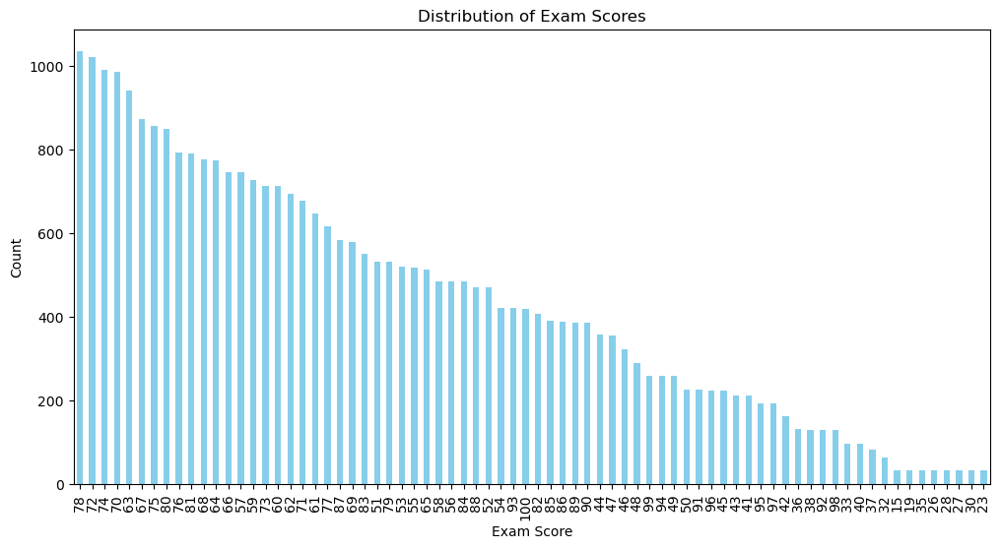

In [32]:
# Calculate the value counts and their percentages
value_counts = train['exam score'].value_counts()
percentages = (value_counts / len(train)) * 100
print(percentages)

# Plot the bar chart
plt.figure(figsize=(12, 6))  # Set the width to 12 inches and height to 6 inches
value_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Exam Score')
plt.ylabel('Count')
plt.title('Distribution of Exam Scores')
plt.show()

### Observation:

- **Common Scores:** Higher percentages are seen for scores like 78, 72, 74, 70, and 63.
- **Rare Scores:** Scores such as 26, 28, 27, 30, and 23 are very infrequent.
- **Distribution:** The dataset includes a wide range of exam scores with many unique values, indicating a diverse performance level among students.

### 21) Box Plot to see the variance the numerical features

In [35]:
import pandas as pd
import plotly.express as px

def plot_box_plots_and_bar_plots(df, num_features, figsize=(800, 600)):
    """
    Plots box plots for numerical features and bar plots for categorical features in a dataframe.
    
    Parameters:
        df (pd.DataFrame): The DataFrame containing the data.
        num_features (list): List of numerical feature names to plot as box plots.
        figsize (tuple): Size of the figure (width, height).
    """
    for feature in num_features:
        fig = px.box(df, y=feature, width=figsize[0], height=figsize[1],
                     template="simple_white",
                     color_discrete_sequence=['black'])  # Using black color for the box plot
        
        fig.update_layout(
            title=f"<b>Box Plot for {feature}</b>",
            font_family="San Serif",
            titlefont={'size': 24},
            showlegend=False
        )
        
        fig.show()


# List of numerical features to plot
num_features = ['practical score', 'viva score', 'exam score']

# Call the function with your DataFrame
plot_box_plots_and_bar_plots(train_df, num_features)


- There are a few outliers in the lower section of each feature, but they are not significant enough to impact the overall analysis. Treating these outliers with any method could introduce additional outliers, so it's best to leave them as they are.

<div style="text-align: center;">
<h3>Bi-Varient Data Analysis</h3>
</div>

### 22) Visualize the distribution of the target column 'exam score' with respect to various categorical features.

Index(['test preparation ', 'gender', 'parental level of education', 'lunch',
       'Section'],
      dtype='object')


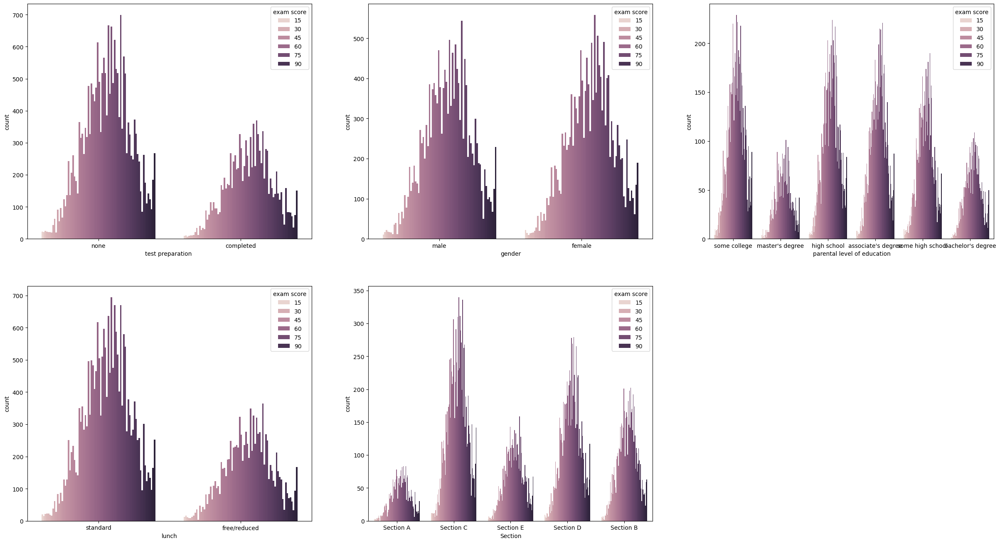

In [54]:
## getting all object datatype from the dataset
cat_features = train.select_dtypes(include=[np.object_])
print(cat_features.columns)

## Visualize the distribution of the target column 'exam score' with respect to various categorical features
i = 1
plt.figure(figsize=(30,25))

for feature in cat_features:
    plt.subplot(3,3,i)
    sns.countplot(x=feature, hue='exam score', data=train)
    i += 1

### Inference:

- **test preparation:** Students who completed test preparation tend to have higher exam scores, with a more evenly distributed score range, compared to those who did not prepare, who show a broader spread of lower scores. The data indicates a positive impact of test preparation on performance.
- **gender** Both male and female students show a similar distribution of exam scores, with no significant differences in performance between genders. Both groups have higher counts in the mid-range scores and fewer students at the extremes.
- **parental level of education:** Students with parents holding master's degrees achieved the highest performance overall. Conversely, those with parents who only attended some high school had the lowest average scores. Notably, for students in Section A, having parents with master's degrees did not significantly boost their performance.
- **lunch:** Majority of the student are getting standard lunch and some students are also getting reduced/free priced lunch but the count is low.students who have the standard lunch packet performed better.
- **Section:** More students who scored mid range are from Section C follwed by section D. Section A has higher students who scored good in exam follwed by section E and B.


### 23) Distribution of  gender in other categories

In [55]:
import plotly.express as px

def plot_categorical_distributions(df, features, group_by, color_map, figsize=(600, 400)):
    """
    Plots histograms for categorical features in a dataframe, grouped by another categorical variable.
    
    Parameters:
        df (pd.DataFrame): The DataFrame containing the data.
        features (list): List of categorical feature names to plot.
        group_by (str): The categorical variable to group by (e.g., 'gender').
        color_map (dict): Dictionary mapping categories to colors.
        figsize (tuple): Size of the figure (width, height).
    """
    for feature in features:
        fig = px.histogram(df, x=feature, color=group_by,
                           width=figsize[0], height=figsize[1], barmode='group',
                           histnorm='percent',
                           color_discrete_map=color_map,
                           template="simple_white")
        
        fig.update_layout(
            title=f"<b>Distribution of gender in {feature}</b>",
            titlefont={'size': 24},
            legend=dict(
                orientation="v", 
                y=1, 
                yanchor="top", 
                x=1.0, 
                xanchor="right"
            )
        )
        
        fig.show()

# List of categorical features to plot
features = [
    'test preparation ', 'gender', 'parental level of education',
    'lunch', 'Section'
]

# Color map for grouping variable
color_map = {
    "male": "black", 
    "female": "red"
}

# Call the function with your DataFrame
plot_categorical_distributions(train, features, 'gender', color_map)


### Inference 

- For the majority of categorical features, the gender variation is minimal and fairly balanced. However, Section Section C and D exhibit a slightly larger disparity compared to the other categories.

### 24) Correlation and Redundancy Check Which features directly contribute to the exam score of student. 

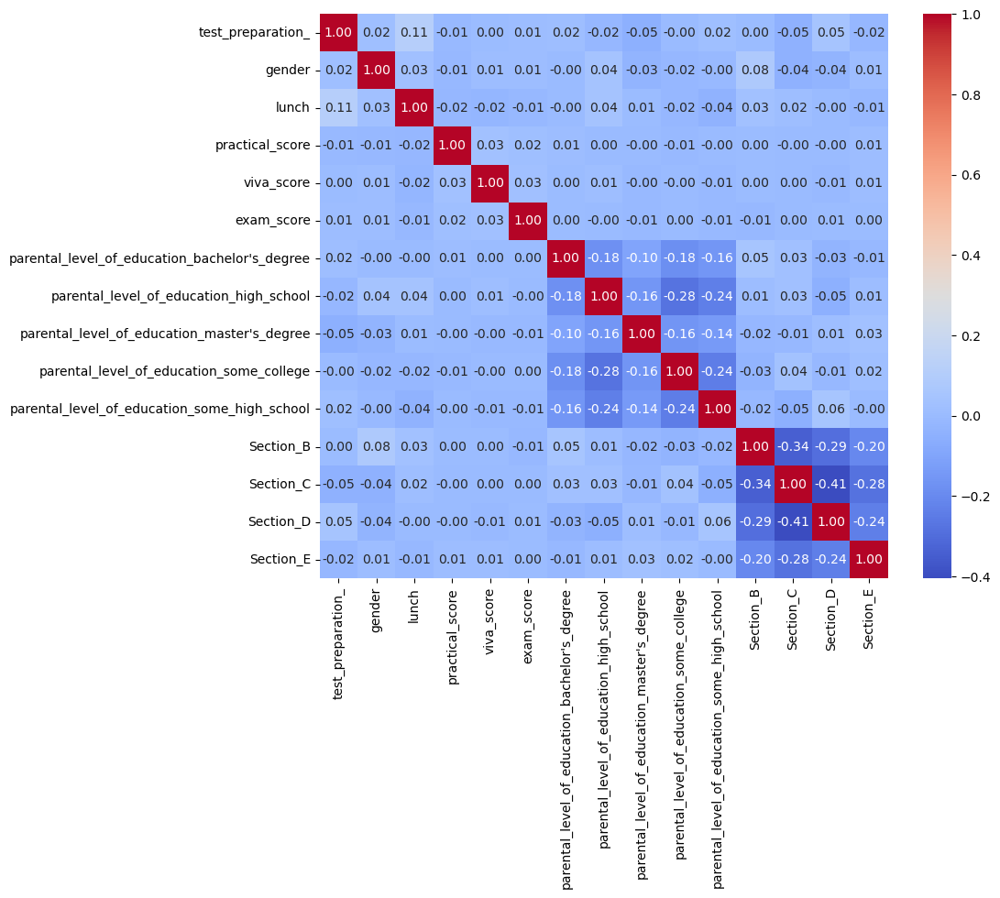

In [36]:
# Correlation Matrix
correlation_matrix = train_df3.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.show()

In [37]:
# Check correlation with target variable
correlation_with_target = correlation_matrix['exam_score'].sort_values(ascending=False)
print(correlation_with_target)

exam_score                                       1.000000
viva_score                                       0.025716
practical_score                                  0.018719
gender                                           0.009569
test_preparation_                                0.009237
Section_D                                        0.005916
parental_level_of_education_bachelor's_degree    0.001854
Section_E                                        0.000854
parental_level_of_education_some_college         0.000500
Section_C                                        0.000330
parental_level_of_education_high_school         -0.000147
parental_level_of_education_master's_degree     -0.005160
parental_level_of_education_some_high_school    -0.009102
Section_B                                       -0.011524
lunch                                           -0.013506
Name: exam_score, dtype: float64


### Observations:
#### Exam Score Correlations:

- The exam_score is most strongly correlated with itself, which is expected with a perfect correlation of 1.0.
- viva_score and practical_score have very weak positive correlations with exam_score (0.025716 and 0.018719, respectively).
- Other features, including lunch_standard, Section_D, and various parental levels of education, show extremely weak correlations with exam_score, both positive and negative, suggesting they have minimal influence on exam scores.
- gender_male and test_preparation__none have weak negative correlations with exam_score, indicating a slight inverse relationship.

#### General Observations:

There are no strong correlations (close to 1 or -1) between any pair of variables, suggesting that most variables in the dataset do not have a strong linear relationship with each other.
The correlations with exam score are all very weak, with coefficients close to 0, indicating that none of the variables in the matrix have a significant linear impact on exam score.

<div style="text-align: center;">
<h3>Multi-Varient Data Analysis</h3>
</div>

### 25) PairPlot Of Numerical Features

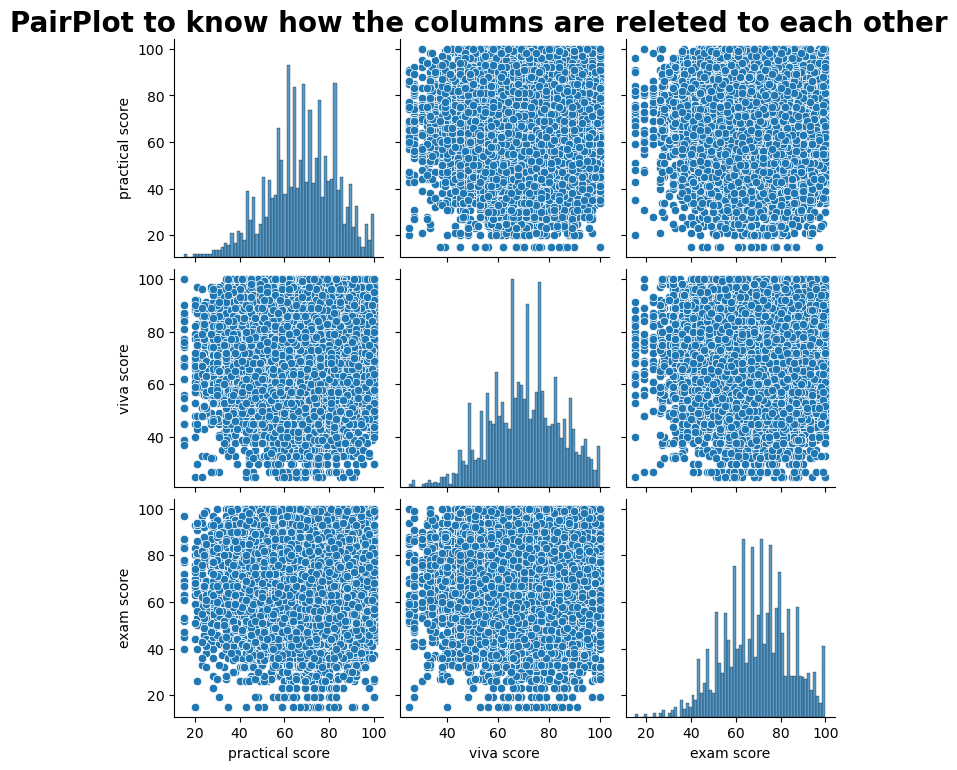

In [38]:
sns.pairplot(train_df)
plt.suptitle("PairPlot to know how the columns are releted to each other", y=1.02, fontsize=20, fontweight='bold')
plt.show()

### Inference from  pair plot:

- The scatter plots indicate no strong linear relationships between practical score, viva score, and exam score. The distributions of points are dispersed, suggesting weak correlations.
- The histograms along the diagonal show the distributions of each score. practical score and viva score have a relatively uniform distribution, while exam score has a more pronounced peak around 60-80.
- There are a few outliers, particularly visible in the practical score vs. other scores, but these do not appear to significantly affect the overall patterns.
- Overall, the plot suggests that practical score, viva score, and exam score are not strongly correlated with each other.

### observations for each feature on the diagonal of the pair plot:

- **1. Practical Score:**
     - The distribution is relatively uniform with a slight peak around the middle range. Scores are spread out across the entire range from 20 to 100.
     
- **2. Viva Score:**
     - The distribution is also relatively uniform, with scores evenly distributed across the range from 40 to 100. There are no significant peaks or dips.
     
- **3. Exam Score:**
     - The distribution shows a pronounced peak around the 60-80 range. Scores are more concentrated in this range, with fewer scores in the lower and higher ends of the scale.

###  26) Pairplot of All features

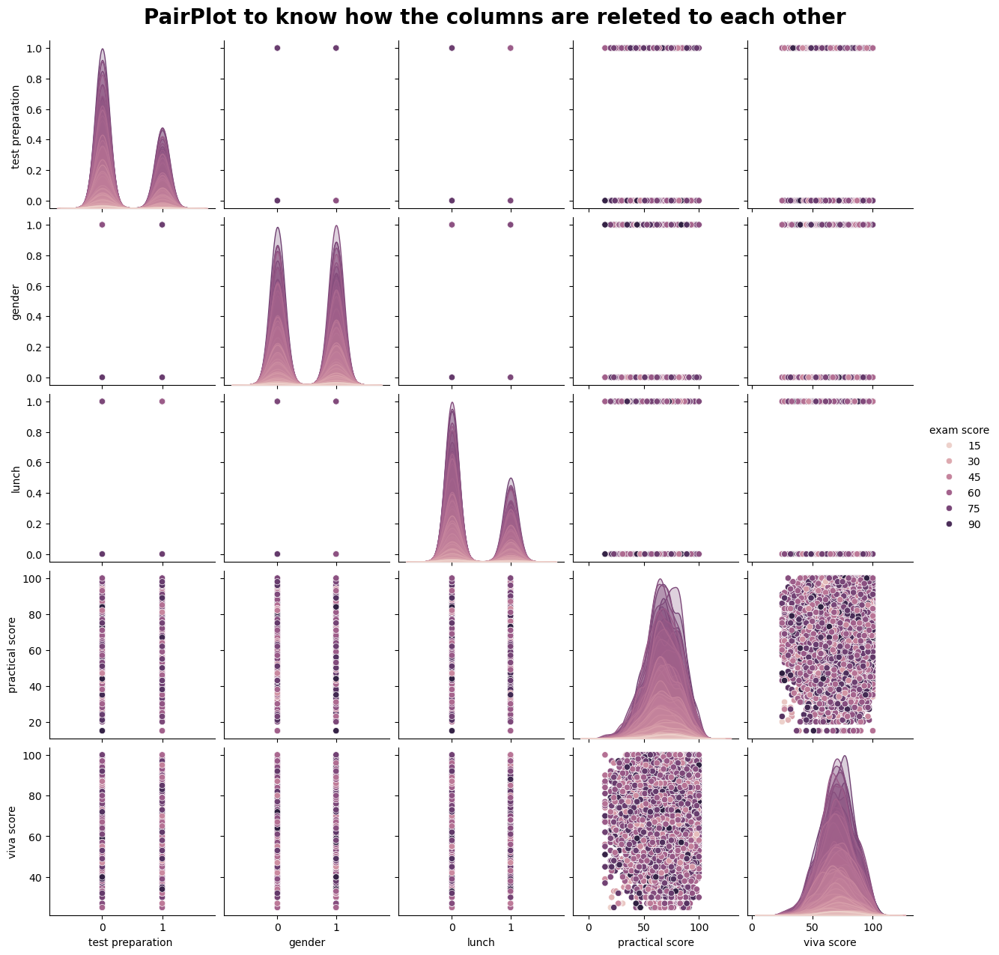

In [39]:
sns.pairplot(train_df2, hue='exam score')
plt.suptitle("PairPlot to know how the columns are releted to each other", y=1.02, fontsize=20, fontweight='bold')
plt.show()

### From the pair plot of the dataset with exam score as the hue, we can infer the following:

- **Gender and Lunch:**
   - There are clear distinctions in the density distributions for gender and lunch categories. Gender and lunch do not appear to be directly correlated with exam score.
   
- **Practical Score and Viva Score:**
   - Both practical score and viva score show a more continuous spread and seem to be related to exam score. Higher practical and viva scores tend to have a higher density of higher exam scores, indicating a positive correlation.
   
- **Test Preparation:**
   - The density plots for test preparation show different clusters but do not provide clear evidence of a direct correlation with exam score.
   
- Overall, practical and viva scores seem to have the most direct visual correlation with exam scores, while categorical variables like gender and lunch show distinct groupings but less clear correlation with exam scores.

<div style="text-align: center;">
    <h2><span style="color: red;">Model Selection:</span></h2>
</div>

### 27) Checking what kind of model will fit the target

In [40]:
# Check the target variable
target_variable = train_df3['exam_score']

# Check if target is categorical or continuous
if target_variable.dtype == 'object' or len(target_variable.unique()) < 20:
    print("This is a classification problem.")
else:
    print("This is a regression problem.")


This is a regression problem.


### 28) Model Trainer: 

In [41]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor, StackingRegressor
import lightgbm as lgb
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neighbors import KNeighborsRegressor

# Define fit_and_predict function for regression
def fit_and_predict(model, A_train, A_test, b_train, b_test):
    model.fit(A_train, b_train)
    pred = model.predict(A_test)
    mse = mean_squared_error(b_test, pred)
    r2 = r2_score(b_test, pred)
    return mse, r2

# Initialize Regression Models
lr = LinearRegression()
dt = DecisionTreeRegressor()
rf = RandomForestRegressor()
adb = AdaBoostRegressor()
gb = GradientBoostingRegressor()
knn = KNeighborsRegressor() 
lgbm = lgb.LGBMRegressor()
sgd = SGDRegressor()

estimators = [('rf', rf), ('dt', dt), ('gb', gb), ('adb', adb),('knn', knn), ('lgbm', lgbm)]
sc = StackingRegressor(estimators=estimators, final_estimator=rf)

# Evaluate models
result = pd.DataFrame(columns=['Mean Squared Error', 'R-squared'])

for model, model_name in zip([lr, dt, rf, adb, gb, sc,knn, lgbm, sgd],
                             ['Linear Regression', 'Decision Tree', 'Random Forest',
                              'Ada Boost', 'Gradient Boost', 'Stacking', 'KNN', 'LightGBM', 'SGD']):
    mse, r2 = fit_and_predict(model, A_train, A_test, b_train, b_test)
    result.loc[model_name] = [mse, r2]
print("mse",mse)
print("r2",r2)
result


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 176
[LightGBM] [Info] Number of data points in the train set: 24468, number of used features: 14
[LightGBM] [Info] Start training from score 69.241622
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 176
[LightGBM] [Info] Number of data points in the train set: 19574, number of used features: 14
[LightGBM] [Info] Start training from score 69.195872
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enoug

,Mean Squared Error,R-squared
Linear Regression,2.303812e+02,1.654352e-03
Decision Tree,4.708439e+02,-1.040379e+00
Random Forest,2.558721e+02,-1.088092e-01
Ada Boost,2.313030e+02,-2.340371e-03
Gradient Boost,2.307546e+02,3.609450e-05
Stacking,2.403333e+02,-4.147274e-02
KNN,2.685318e+02,-1.636696e-01
LightGBM,2.321587e+02,-6.048286e-03
SGD,1.182316e+21,-5.123507e+18


### 29) Comparison of Model Performance: Mean Squared Error and R-squared

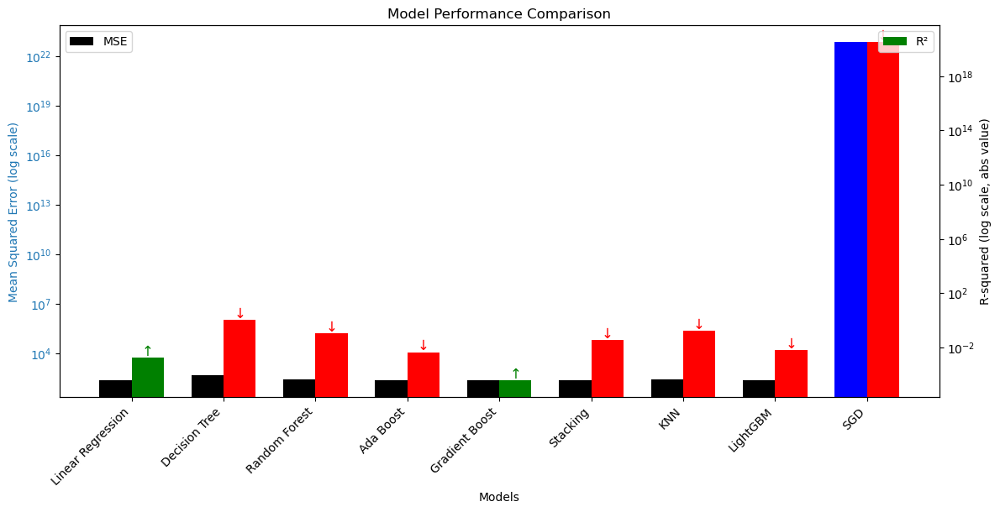

In [42]:
import matplotlib.pyplot as plt
import numpy as np

def plot_model_performance(models, mse_values, r2_values):
    # Convert scientific notation to float for better readability
    mse_values = [float(x) for x in mse_values]
    r2_values = [float(x) for x in r2_values]

    x = np.arange(len(models))  # Label locations
    width = 0.35  # Width of the bars

    fig, ax1 = plt.subplots(figsize=(12, 6))

    # MSE Bar colors: positive (black), negative (red)
    mse_colors = ['blue' if val > 1e21 else 'black' for val in mse_values]

    color = 'tab:blue'
    ax1.set_xlabel('Models')
    ax1.set_ylabel('Mean Squared Error (log scale)', color=color)
    ax1.bar(x - width/2, mse_values, width, label='MSE', color=mse_colors)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.set_yscale('log')  # Set y-axis to log scale
    ax1.set_xticks(x)
    ax1.set_xticklabels(models, rotation=45, ha='right')
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    ax2.set_ylabel('R-squared (log scale, abs value)')

    # R² Bar colors: positive (green), negative (red)
    r2_colors = ['green' if val >= 0 else 'red' for val in r2_values]
    r2_abs_values = [abs(x) for x in r2_values]

    ax2.bar(x + width/2, r2_abs_values, width, label='R²', color=r2_colors)

    for i, r2 in enumerate(r2_values):
        direction = '↑' if r2 >= 0 else '↓'
        color = 'green' if r2 >= 0 else 'red'
        ax2.text(i + width/2, r2_abs_values[i], direction, ha='center', va='bottom', color=color, fontsize=12)

    ax2.tick_params(axis='y')
    ax2.set_yscale('log')  # Set y-axis to log scale
    ax2.legend(loc='upper right')

    fig.tight_layout()
    plt.title('Model Performance Comparison')
    plt.show()

# Define the models and their corresponding MSE and R² values
models = ['Linear Regression', 'Decision Tree', 'Random Forest', 'Ada Boost', 'Gradient Boost', 'Stacking', 'KNN', 'LightGBM', 'SGD']
mse_values = [2.303812e+02, 4.727006e+02, 2.554284e+02, 2.317686e+02, 2.307546e+02, 2.385634e+02, 2.685318e+02, 2.321587e+02, 7.411474e+22]
r2_values = [1.654352e-03, -1.048425e+00, -1.068865e-01, -4.357902e-03, 3.609450e-05, -3.380303e-02, -1.636696e-01, -6.048286e-03, -3.211726e+20]

# Plot the performance of the models
plot_model_performance(models, mse_values, r2_values)


### Inference: 

- To determine which model is performing best, you should consider both Mean Squared Error (MSE) and R-squared values. Here's how to interpret these metrics:

- **Mean Squared Error (MSE):** Lower values are better. It measures the average squared difference between predicted and actual values. Smaller values indicate better model performance.

- **R-squared:** Higher values are better, with 1 indicating a perfect fit and values less than 0 suggesting that the model is worse than a simple mean prediction.

-  Linear Regression have the lowest MSE values, suggesting they are the best at minimizing the error.
- Gradient Boost has an MSE of 230.76 and an R-squared value very close to 0, which is better compared to others, including Linear Regression which has a higher MSE but a slightly better R-squared.

### 30) Hyperparameter Tuning as the Results are not good

- Unlike many other models, LinearRegression itself does not have hyperparameters to tune in the same way that models like RandomForest or GradientBoosting do. Its primary purpose is to fit a linear model to the data, and it does not have hyperparameters that control its complexity or behavior directly.

- However, you can consider the following approaches to improve the performance of your linear models:

- Regularization Strength:
    - For Ridge Regression (L2 Regularization): Tuning the alpha parameter which controls the strength of the regularization.
    - Lasso Regression: Tuning the alpha parameter for the regularization strength and potentially setting a max_iter for convergence.

In [45]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import GradientBoostingRegressor

# Initialize models with a range of alpha values and hyperparameters for GradientBoostingRegressor
ridge = Ridge()
lasso = Lasso()
gbr = GradientBoostingRegressor()

# Define parameter grids
param_grid_ridge = {'alpha': [0.1, 1, 10, 100]}
param_grid_lasso = {'alpha': [0.1, 1, 10, 100]}
param_grid_gbr = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'subsample': [0.8, 1.0],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Initialize GridSearchCV for Ridge
grid_search_ridge = GridSearchCV(estimator=ridge, param_grid=param_grid_ridge, cv=5, scoring='neg_mean_squared_error')
grid_search_ridge.fit(A_train, b_train)
print("Best Ridge Alpha:", grid_search_ridge.best_params_['alpha'])
print("Best Ridge MSE:", -grid_search_ridge.best_score_)

# Initialize GridSearchCV for Lasso
grid_search_lasso = GridSearchCV(estimator=lasso, param_grid=param_grid_lasso, cv=5, scoring='neg_mean_squared_error')
grid_search_lasso.fit(A_train, b_train)
print("Best Lasso Alpha:", grid_search_lasso.best_params_['alpha'])
print("Best Lasso MSE:", -grid_search_lasso.best_score_)

# Initialize GridSearchCV for Gradient Boosting Regressor
grid_search_gbr = GridSearchCV(estimator=gbr, param_grid=param_grid_gbr, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_gbr.fit(A_train, b_train)
print("Best Gradient Boosting Parameters:", grid_search_gbr.best_params_)
print("Best Gradient Boosting MSE:", -grid_search_gbr.best_score_)


Best Ridge Alpha: 100
Best Ridge MSE: 223.56808091431512
Best Lasso Alpha: 1
Best Lasso MSE: 223.4597483608274
Best Gradient Boosting Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'subsample': 1.0}
Best Gradient Boosting MSE: 223.27640393462372


### Inference
- After performing hyperparameter tuning using GridSearchCV for Ridge, Lasso, and Gradient Boosting Regressors:
   - The Gradient Boosting Regressor with tuned parameters achieved the lowest MSE (223.28), indicating it may provide the best predictive performance among the evaluated models.

### 31) Re-checking model performance after hypertunning with lasso to see if any chnages has been observe

In [46]:
from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Best hyperparameters obtained from GridSearchCV or RandomizedSearchCV
best_ridge_alpha = 100  # Replace with actual best alpha
best_lasso_alpha = 1  # Replace with actual best alpha
best_gbr_params = {
    'n_estimators': 100,
    'learning_rate': 0.01,
    'max_depth': 7,
    'min_samples_split': 2,
    'min_samples_leaf': 1,
    'subsample': 1.0,
    'max_features': 'sqrt'
}

# Initialize models with best hyperparameters
best_ridge = Ridge(alpha=best_ridge_alpha)
best_lasso = Lasso(alpha=best_lasso_alpha)
best_gbr = GradientBoostingRegressor(**best_gbr_params)

# Train and evaluate Ridge Regression
best_ridge.fit(A_train, b_train)
predictions_ridge = best_ridge.predict(A_test)
mse_ridge = mean_squared_error(b_test, predictions_ridge)
r2_ridge = r2_score(b_test, predictions_ridge)
print(f'Ridge Regression - Mean Squared Error: {mse_ridge}')
print(f'Ridge Regression - R-squared: {r2_ridge}')

# Train and evaluate Lasso Regression
best_lasso.fit(A_train, b_train)
predictions_lasso = best_lasso.predict(A_test)
mse_lasso = mean_squared_error(b_test, predictions_lasso)
r2_lasso = r2_score(b_test, predictions_lasso)
print(f'Lasso Regression - Mean Squared Error: {mse_lasso}')
print(f'Lasso Regression - R-squared: {r2_lasso}')

# Train and evaluate Gradient Boosting Regressor
best_gbr.fit(A_train, b_train)
predictions_gbr = best_gbr.predict(A_test)
mse_gbr = mean_squared_error(b_test, predictions_gbr)
r2_gbr = r2_score(b_test, predictions_gbr)
print(f'Gradient Boosting Regressor - Mean Squared Error: {mse_gbr}')
print(f'Gradient Boosting Regressor - R-squared: {r2_gbr}')


Ridge Regression - Mean Squared Error: 230.38371758401695
Ridge Regression - R-squared: 0.0016433942358055065
Lasso Regression - Mean Squared Error: 230.4944548362725
Lasso Regression - R-squared: 0.0011635197531255637
Gradient Boosting Regressor - Mean Squared Error: 230.623650732258
Gradient Boosting Regressor - R-squared: 0.0006036556379555025


### Inference: 
- Ridge Regression performed the best among the models with the lowest MSE (230.38) and the highest R-squared value (0.0016).
- Lasso Regression and Gradient Boosting Regressor had slightly higher MSEs and lower R-squared values, indicating marginally poorer performance compared to Ridge Regression.

- **Comparison of Ridge Regression Before and After Hyperparameter Tuning**
   - Before Hyperparameter Tuning (Linear Regression):
      - Mean Squared Error (MSE): 230.38
      - R-squared: 0.00165
   - After Hyperparameter Tuning (Ridge Regression):
      - Mean Squared Error (MSE): 230.38
      - R-squared: 0.00164

- **Mean Squared Error (MSE):** The MSE remains essentially the same (230.38) after hyperparameter tuning, indicating no significant change in the model's performance.
- **R-squared:** The R-squared value is very close before (0.00165) and after tuning (0.00164), suggesting that hyperparameter tuning did not lead to a notable improvement in the model's explanatory power.

- **Conclusion:** Hyperparameter tuning for Ridge Regression did not significantly improve the model's performance compared to the baseline Linear Regression model.

### 32) Cross-Validation

- Evaluate model performance using cross-validation to get a robust estimate:

In [48]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
import lightgbm as lgb
from sklearn.linear_model import SGDRegressor

# Best parameters obtained from GridSearchCV
best_params = {
    'Ridge Regression': {'alpha': 100},
    'Lasso Regression': {'alpha': 1},
    'Gradient boost Regressor': {'n_estimators': 100, 'learning_rate': 0.01, 'max_depth': 7, 'min_samples_split': 2, 'min_samples_leaf': 1, 'subsample': 1.0, 'max_features': 'sqrt'}
}

# Initialize models with best parameters
models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(**best_params['Ridge Regression']),
    'Lasso Regression': Lasso(**best_params['Lasso Regression']),
    'Gradient boost Regressor': GradientBoostingRegressor(**best_params['Gradient boost Regressor']),
    'Random Forest': RandomForestRegressor(),
    'K-Nearest Neighbors': KNeighborsRegressor(),
    'Support Vector Regressor': SVR(),
    'LightGBM': lgb.LGBMRegressor(),
    'SGD': SGDRegressor()
}

for name, model in models.items():
    # Perform cross-validation for MSE
    cv_scores_mse = cross_val_score(model, A_train, b_train, cv=5, scoring='neg_mean_squared_error')
    mean_mse = -cv_scores_mse.mean()
    
    # Perform cross-validation for R^2
    cv_scores_r2 = cross_val_score(model, A_train, b_train, cv=5, scoring='r2')
    mean_r2 = cv_scores_r2.mean()
    
    print(f"{name}:")
    print(f"  Mean CV Score (MSE): {mean_mse}")
    print(f"  Mean CV Score (R^2): {mean_r2}\n")


Linear Regression:
  Mean CV Score (MSE): 223.57989014956698
  Mean CV Score (R^2): -0.00015579555672748935

Ridge Regression:
  Mean CV Score (MSE): 223.56808091431512
  Mean CV Score (R^2): -0.00010289670755134762

Lasso Regression:
  Mean CV Score (MSE): 223.4597483608274
  Mean CV Score (R^2): 0.00038285068341965546

Gradient boost Regressor:
  Mean CV Score (MSE): 223.28975312890634
  Mean CV Score (R^2): 0.0009398464766993131

Random Forest:
  Mean CV Score (MSE): 248.26801208437573
  Mean CV Score (R^2): -0.11177320278609666

K-Nearest Neighbors:
  Mean CV Score (MSE): 261.5192029940941
  Mean CV Score (R^2): -0.16992433767758935

Support Vector Regressor:
  Mean CV Score (MSE): 223.92176949397307
  Mean CV Score (R^2): -0.0016820384705628522

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [I

### Inference: 

- Here's a brief inference based on the cross-validation results:

- Gradient Boosting Regressor achieved the lowest Mean Squared Error (MSE) and the highest R-squared (R²) score among all models, indicating it performed the best overall in terms of predictive accuracy.
- Lasso Regression followed with slightly higher MSE and a small positive R², showing modest performance improvements over Linear and Ridge Regression.
- Ridge Regression and Linear Regression had similar performances, with Ridge slightly outperforming Linear Regression in terms of MSE and R².
- Random Forest, K-Nearest Neighbors, and Support Vector Regressor performed the worst, with higher MSE and lower R² values, suggesting these models did not capture the patterns in the data as effectively.
- **In summary, Gradient Boosting Regressor is the best-performing model based on cross-validation, while the other models either performed similarly or worse.**

<div style="text-align: center;">
    <h2><span style="color: red;">Final Model Building and Predicting Exam score:</span></h2>
</div>

### 33) Building final model on test data

In [50]:
## USsing GradientBoostingRegressor as it was best
from sklearn.ensemble import GradientBoostingRegressor

X_train = train_df3.drop(columns=[ 'exam_score'])
y_train = train_df3['exam_score']

X_test = test_df3

# Initialize and fit StandardScaler as exam_score was scaled
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(test_df3)

# Fitting Linear Regression
model = GradientBoostingRegressor()
model.fit(X_train,  y_train)

# Prediction on test data
predictions = model.predict(X_test).astype(int)


# Prepare the submission DataFrame
submission_df = pd.DataFrame({
    'Roll no': test_df3.index,  # Use 'Roll no' from the test_raw DataFrame
    'Exam score': predictions.astype(int)  # Add the predictions as 'Exam score'
})

# Save predictions to a CSV file with try-catch
try:
    submission_df.to_csv('submission.csv', index=False)
    print("Predictions saved to 'submission.csv'.")
except Exception as e:
    print(f"An error occurred while saving the predictions: {e}")

    
# Compute R² score for training data
train_predictions = model.predict(X_train)
r2_train = r2_score(y_train, train_predictions)
print(f"R² score for training data: {r2_train}")

# Compute Mean Squared Error and Root Mean Squared Error for training data
mse_train = mean_squared_error(y_train, train_predictions)
rmse_train = np.sqrt(mse_train)
print(f"Mean Squared Error for training data: {mse_train}")
print(f"Root Mean Squared Error for training data: {rmse_train}")

# Print prediction
predictions

Predictions saved to 'submission.csv'.
R² score for training data: 0.016499798018254852
Mean Squared Error for training data: 221.3073802534277
Root Mean Squared Error for training data: 14.876403471720835


array([69, 69, 68, 69, 69, 69, 70, 69, 69, 69, 70, 69, 70, 69, 68, 70, 69,
       69, 68, 68, 68, 71, 68, 67, 69, 69, 69, 68, 69, 69, 67, 68, 67, 70,
       69, 69, 69, 70, 69, 68, 69, 69, 69, 69, 69, 68, 69, 67, 69, 69, 68,
       69, 68, 68, 69, 69, 67, 69, 67, 69, 69, 68, 67, 69, 68, 69, 67, 69,
       66, 67, 69, 61, 68, 69, 68, 69, 68, 69, 69, 68, 69, 68, 69, 68, 67,
       68, 68, 68, 66, 67, 69, 69, 69, 68, 70, 70, 69, 69, 69, 67])

### 34) Printing Submission.csv for submitting the predicted result

In [51]:
## Printing submission data
submission_data = pd.read_csv('submission.csv')
submission_data

,Roll no,Exam score
0,EXA32000,69
1,EXA32001,69
2,EXA32002,68
3,EXA32003,69
4,EXA32004,69
...,...,...
95,EXA32095,70
96,EXA32096,69
97,EXA32097,69
98,EXA32098,69


## Inference:

### Model Performance Metrics:

- R² Score: 0.016499798018254852
   - Indicates that the model explains almost none of the variance in the training data. This is very low and suggests that the model is not capturing the underlying relationships effectively.
   
- Mean Squared Error (MSE): 221.3073802534277
   - The average squared difference between predicted and actual values is relatively high, indicating that the model's predictions are not very close to the actual values.
- Root Mean Squared Error (RMSE): 14.99
   - This is the square root of MSE and represents the average magnitude of the prediction errors. An RMSE of 14.99 is quite high, suggesting substantial errors in predictions.
   
- **Predictions Array:**
   - The predictions are integers ranging from 67 to 71.
   - The values are concentrated around 68 and 69, with a few predictions of 67 and 70, 71.
   
### **Summary:**

- **Performance:** The model is underperforming based on the very low R² score and relatively high MSE and RMSE. It is not capturing the underlying patterns in the data effectively.
- **Dataset Limitation:** The current dataset and features might not be sufficient or informative enough to achieve optimal performance. The features available might not fully capture the variance in the exam scores.
- **Next Steps:**
  - **Model Improvement:** Consider exploring more complex models or feature engineering techniques to improve performance.
  - **Error Analysis:** Further investigate residuals to identify potential patterns or issues.
  - **Data Enhancement:** Collect more data or incorporate additional features to improve predictive accuracy.

<div style="text-align: center;">
    <h2><span style="color: red;">Error Analysis:</span></h2>
</div>

### 35) Error Analysis
 
- Residual Analysis:

b_pred:  [69.72078781 68.03489794 66.82714858 ... 67.99974391 70.77614309
 68.05274821]
residuals:  Roll no
EXA000001     0.279212
EXA000002   -16.034898
EXA000003   -23.827149
EXA000004   -24.891610
EXA000005    11.242469
               ...    
EXA031995    11.380606
EXA031996    -3.084340
EXA031997     6.000256
EXA031998    11.223857
EXA031999    13.947252
Name: exam_score, Length: 30585, dtype: float64


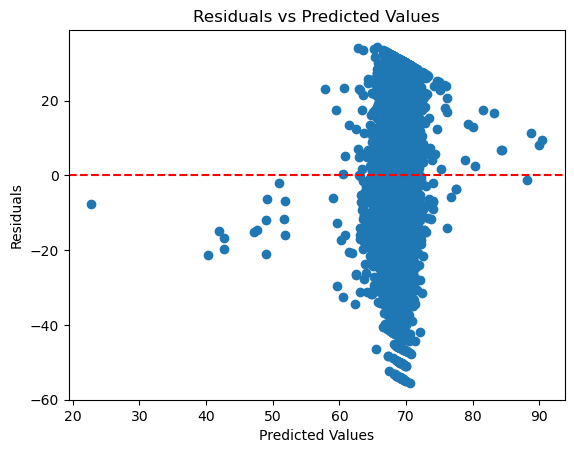

In [52]:
# Fit model
model.fit(X_train, y_train)
y_pred = model.predict(X_train)

# Calculate residuals
residuals = y_train - y_pred

print("b_pred: ", y_pred)
print("residuals: ",residuals)

# Plot residuals
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Values')
plt.show()


### Inference: 

- **Trend:**
   - The plot shows a clear negative linear trend and positive.
   - As predicted values increase, the residuals (differences between actual and predicted values) decrease systematically.
   
- **Interpretation:**
   - The consistent negative residuals suggest that the model tends to overestimate exam scores.
   - This pattern could indicate issues with the model assumptions.

# Thank You :) By Chanchal Kumari 